In [1]:
import numpy as np
import matplotlib.pyplot as plt
import random
from numba import njit
from time import sleep
from scipy.stats import truncnorm

#Movie libraries
from IPython.display import HTML
from matplotlib.animation import FuncAnimation
from mpl_toolkits.axes_grid1 import make_axes_locatable

#np.random.seed(19680801)

In [2]:
def trunc_gaussian(mu, sigma, plot = False):
    mean = mu
    std = sigma
    # Limits of truncation
    myclip_a = 0
    myclip_b = 1
    
    a, b = (myclip_a - mean) / std, (myclip_b - mean) / std
    if plot:
        x_range = np.linspace(-1,2,1000)
        plt.plot(x_range, truncnorm.pdf(x_range, a, b, loc = mean, scale = std))

    return truncnorm.rvs(a, b, loc = mean, scale = std)

@njit
def trunc_gaussian_jit_sample(mu, sigma):
    sample = -1
    while sample < 0 or sample > 1:
        sample = np.random.normal(mu, sigma)
    return sample    

@njit
def truncated_gaussian_jit(mu, sigma, size):
    samples = np.zeros(size, dtype=np.float32)
    for i in range(size):
        samples[i] = trunc_gaussian_jit_sample(mu, sigma)
        
    return samples

def test_truncated_normal(sigma):
    mean = 0.5
    std = sigma
    
    # Limits of truncation
    myclip_a = 0
    myclip_b = 1
    a, b = (myclip_a - mean) / std, (myclip_b - mean) / std    
    
    samples = truncated_gaussian_jit(mean, sigma, 1000000)
    n, x, _ = plt.hist(samples, bins=100, density=True)
    #plt.xlim((-0.1,1.1))
    plt.plot(x, truncnorm.pdf(x, a, b, loc = mean, scale = std)) 
    
    plt.show()


@njit
def autocorrelation(System, SystemSnapshot):
    Ly, Lx = System.shape
    Ly0,Lx0 = SystemSnapshot.shape
    
    if Ly0 != Ly or Lx0 != Lx:
        raise ValueError("Shape of System and SystemSnapshot is not equal")
    
    size = Lx * Ly    
    DensityParticles = np.sum(System) / size
    
    Sum = 0
    for i in range(Ly):
        for j in range(Lx):
            Sum += System[i][j] * SystemSnapshot[i][j]
    Corr = (Sum / size) - (DensityParticles)**2 # 0.25 is the density of particles^2
    
    return Corr

@njit
def checkboard(mu, sigma): # Filling the lattice (Lx*Ly) with particles alternatively (chess fashion)    
    System = np.zeros((Ly, Lx), dtype=np.float32)  # Ly vectors with Lx (zero) components 

    System[::2, ::2] = 1  # Set even rows and even columns to 1
    System[1::2, 1::2] = 1  # Set odd rows and odd columns to 1

    JumpRateGrid = np.ones((Ly,Lx))*(-0.1)
    for i in range(Ly):
        for j in range(Lx):
            if System[i][j] == 1:
                JumpRateGrid[i][j] = trunc_gaussian_jit_sample(mu, sigma)
                
                #Build-in method
                #JumpRateGrid[i][j] = trunc_gaussian(mu, sigma)
                
                # Old method
                # JumpRateGrid[i][j] = np.random.normal(mu, sigma)                
                # # Limiting its values to [0,1]
                # if JumpRateGrid[i][j] > 1:
                #     JumpRateGrid[i][j] = 1
                # elif JumpRateGrid[i][j] < 0:
                #     JumpRateGrid[i][j] = 0
                    
    return System, JumpRateGrid

@njit
def random_system(n, mu, sigma): # Filling the lattice (Lx*Ly) randomly with n particles
    assert n <= (Lx*Ly)     
    System = np.concatenate((np.ones(n, dtype=np.float32), np.zeros(Lx*Ly-n, dtype=np.float32))) 
    np.random.shuffle(System)
    System = System.reshape((Ly, Lx))
    
    JumpRateGrid = np.ones((Ly,Lx), dtype=np.float32)*(-0.1)
    for i in range(Ly):
        for j in range(Lx):
            if System[i][j] == 1:
                JumpRateGrid[i][j] = trunc_gaussian_jit_sample(mu, sigma) # probability of jumping forward or transversally
                
                #Build-in method
                #JumpRateGrid[i][j] = trunc_gaussian(mu, sigma)                
                
                # Old method                
                # JumpRateGrid[i][j] = np.random.normal(mu, sigma)                
                # # Limiting its values to [0,1]
                # if JumpRateGrid[i][j] > 1:
                #     JumpRateGrid[i][j] = 1
                # elif JumpRateGrid[i][j] < 0:
                #     JumpRateGrid[i][j] = 0                

    return System, JumpRateGrid



In [35]:
@njit
def step(System, JumpRateGrid, X, Y):     # Simulating exchange dynamics
    Along_step = 0
    Transv_step  = 0
    
    # TASEP, deciding direction: p=1/2 of jumping foward, p=1/4 of jumping up or down                  
    dice = random.randint(0, 1)
    if dice == 0:
        JumpAlong = 0
        JumpTransverse = 2 # No jump up or down
    else:
        JumpAlong = 2 # No jump forward
        JumpTransverse = random.randint(0, 1)                        

    # Getting velocity/jumping_rate of the particle at [X][Y]
    JumpRate = JumpRateGrid[X][Y] 
    dice_jump = random.random() # Deciding if it moves or not

    # Simple implementation of Periodic boundary conditions
    xPrev = Ly - 1 if X == 0 else X - 1        
    xNext = 0 if X == Ly - 1 else X + 1
    yNext = 0 if Y == Lx - 1 else Y + 1
    
    # Updating the system
    if dice_jump < JumpRate:
        if JumpAlong == 0:             # tries to hop forward
            if System[X][yNext] == 0:  # if next site is free
                System[X][Y], System[X][yNext] = System[X][yNext], System[X][Y]
                JumpRateGrid[X][Y], JumpRateGrid[X][yNext] = JumpRateGrid[X][yNext], JumpRateGrid[X][Y]
                Along_step = 1

        if JumpTransverse == 0: # hop up
            if System[xPrev][Y] == 0: 
                System[X][Y], System[xPrev][Y] = System[xPrev][Y], System[X][Y]
                JumpRateGrid[X][Y], JumpRateGrid[xPrev][Y] = JumpRateGrid[xPrev][Y], JumpRateGrid[X][Y]
                Transv_step = 1

        if JumpTransverse == 1: # hop down
            if System[xNext][Y] == 0: 
                System[X][Y], System[xNext][Y] = System[xNext][Y], System[X][Y]
                JumpRateGrid[X][Y], JumpRateGrid[xNext][Y] = JumpRateGrid[xNext][Y], JumpRateGrid[X][Y]
                Transv_step = -1
               
    return System, JumpRateGrid, Along_step, Transv_step

@njit
def Simulate(runsNumber, totalMCS, Lx, Ly, init, mu, sigma):
 # Check utilities
    print_stuff = 0 #0 do not print; 1 print basics; 2 print details; for unit tests
    if print_stuff == 2 and totalMCS > 10:
        raise ValueError("totalMCS too big to print everything")
    SystemCheckboard = np.zeros((Ly, Lx), dtype=np.float32)  # Ly vectors with Lx (zero) components 
    SystemCheckboard[::2, ::2] = 1  # Set even rows and even columns to 1
    SystemCheckboard[1::2, 1::2] = 1  # Set odd rows and odd columns to 1
    
 # Memory allocation                   
    DensityParticlesTot = np.zeros(totalMCS, dtype=np.float32) 
    CorrTot = np.zeros(totalMCS, dtype=np.float32) 
    CurrentAlongTot = np.zeros(totalMCS, dtype=np.float32)  # totalMCS vectors with Ly (zero) components 
    CurrentTransvTot = np.zeros(totalMCS, dtype=np.float32)  # totalMCS vectors with Ly (zero) components
    OccupationGridTot = np.zeros((Ly, Lx), dtype=np.float32)

 #Beginning of the simulation
    for iwalk in range(runsNumber):
       # Initialize system
        if init == "chess":  # Filling the lattice with particles alternatively (chess fashion)
            System, JumpRateGrid = checkboard(mu, sigma)
        elif init == "random": # Filling the lattice with N particles randomly
            System, JumpRateGrid = random_system(N, mu, sigma)
        
       # Mapping System at t=0
        SystemSnapshot = System.copy()
        if init == "chess" and print_stuff > 0: 
            if (SystemSnapshot != SystemCheckboard).all(): raise ValueError("System at t=0, not in checkboard mode")        
        if print_stuff == 2: print(SystemSnapshot)

       # Frames for the animation
         # Frames of the location of particles
        System_movie = np.zeros((N+1, Ly, Lx), dtype=np.float32)
        System_movie[0] = SystemSnapshot

         # Frames of each movement in one MCS
        JumpRate_movie = np.zeros(((totalMCS*N)+1, Ly, Lx), dtype=np.float32)
        JumpRate_movie[0] = JumpRateGrid

         # Frames of set of movements after one MCS   
        JumpRate_short_movie = np.zeros((totalMCS+1, Ly, Lx), dtype=np.float32)
        JumpRate_short_movie[0] = JumpRateGrid 

       # Memory allocation                   
        Corr = np.zeros(totalMCS, dtype=np.float32)
        DensityParticles = np.zeros(totalMCS, dtype=np.float32) 
        OccupationGrid = np.zeros((Ly, Lx), dtype=np.float32)
        CurrentAlong = np.zeros(totalMCS, dtype=np.float32) 
        CurrentTransv = np.zeros(totalMCS, dtype=np.float32)

       # Beginning of a single run
        for istep in range(totalMCS):
            Along_count = 0
            Transv_count = 0

            # Computes correlation function; CorrFunction[0] = 0.25 by definition 
            Corr[istep] += autocorrelation(System, SystemSnapshot)
            if init == "chess" and Corr[0] != 0.25:
                raise ValueError("Initial correlation at the checkboard distribution is not 0.25")

            for moveAttempt in range(N): # To make a move over all particles
                while True:
                    dice = random.randint(0, Lx * Ly - 1)  # Picks the random lattice site in the array
                    """ 
                    The lattice is labelled from the left top to the right 
                     [X,Y]= (0,0), (0,1), (0,2) 
                     (1,0), (1,1), (1,2)
                    """                    
                    X = dice // Lx
                    Y = dice - X * Lx

                    if System[X][Y] == 1: # The lattice has to be occupied
                        System, JumpRateGrid, Along_step, Transv_step = step2(System, JumpRateGrid, X, Y)
                        if moveAttempt % 2 == 0 and moveAttempt > 0:  #checks if moveAttempt is an exact multiple of current_averaging_time.
                            Along_count += Along_step
                            Transv_count += Transv_step
                        
                        # Frames for the movie
                        System_movie[moveAttempt+1] = System
                        JumpRate_movie[(istep*N)+moveAttempt+1] = JumpRateGrid
                        
                        break

            # Frames for the movie at the last MCS
            JumpRate_short_movie[istep+1] = JumpRateGrid

            # Computes currents
            CurrentAlong[istep] = Along_count / current_averaging_time # Sum of the current along Lx
            CurrentTransv[istep] = Transv_count / current_averaging_time # Sum of the current along Ly
            
            # Computes the total number of particles
            DensityParticles[istep] = np.sum(System) / size

            if DensityParticles[istep] != 0.5:
                raise ValueError("The density of particles does not conserve")

            # To compute occupation probability
            OccupationGrid += System


        # Computing parameters after a single run
        OccupationGrid /= totalMCS
        OccupationGridTot += OccupationGrid

        for dt in range(totalMCS):
            CorrTot[dt] += Corr[dt]
            DensityParticlesTot[dt] += DensityParticles[dt] 
            CurrentAlongTot[dt] += CurrentAlong[dt]
            CurrentTransvTot[dt] += CurrentTransv[dt]


        if print_stuff == 1 or print_stuff == 2: print("Runs done:", iwalk+1)


    # Simulation results output
    for dt in range(totalMCS):
        CorrTot[dt] /= runsNumber
        DensityParticlesTot[dt] /= (runsNumber)
        CurrentAlongTot[dt] /= (runsNumber)
        CurrentTransvTot[dt] /= (runsNumber)

    # Occupation probability along the X axis
    OccupationGridTot /= runsNumber
    HorizontalOccupProb = OccupationGridTot.sum(axis=0)/Ly


    #print('Finished!')
    #print(f"Run number: {iwalk}/{runsNumber}\r")
    
    return DensityParticlesTot, CorrTot, CurrentAlongTot, CurrentTransvTot, HorizontalOccupProb, JumpRate_movie, JumpRate_short_movie

In [36]:
def density_particles(sigma):
    DensityParticlesTot, CorrTot, CurrentAlongTot, CurrentTransvTot, HorizontalOccupProb, JumpRate_movie, JumpRate_short_movie = Simulate(runsNumber, totalMCS, Lx, Ly, init, mu, sigma)    
    x_axis=np.array(range(totalMCS))
    plt.plot(x_axis[5:], DensityParticlesTot[5:], color='blue')
    
    plt.title(f"TASEP. Gaussian jumping rate over {runsNumber} runs")    
    plt.xlabel('Time')
    plt.ylabel('Density of Particles')
#     stats = ('Initial cond. = %s \n'
#              f'MCS = %i \n'
#              f'(Lx, Ly) = %(i,i) \n'
#              f'$\\mu$ = {mu:.2f}'% (init, totalMCS, (Lx, Ly)))

#     plt.text(totalMCS/5, 0.515, stats , fontsize=12, ha="center", va="center",
#              bbox=dict(boxstyle="square",color= 'lightskyblue'
#                       ))
    plt.grid(True) 
    #plt.savefig('Random_sigma=0,3 - Density.pdf')
    
    
def autocorrelation_plot(sigma):
    DensityParticlesTot, CorrTot, CurrentAlongTot, CurrentTransvTot, HorizontalOccupProb, JumpRate_movie, JumpRate_short_movie = Simulate(runsNumber, totalMCS, Lx, Ly, init, mu, sigma)    
    x_axis=np.array(range(1,totalMCS+1))
    f=1/x_axis
    f2 = 0.1*x_axis**(-1.1)
    plt.plot(x_axis[5:], f2[5:], color='black', label = 'Out of the steady state')
    plt.plot(x_axis[5:], CorrTot[5:], '.', color='coral', label = 'Samples')
    plt.title(f"TASEP. Gaussian jumping rate over {runsNumber} runs")
    plt.xlabel('Time (log scale)')
    plt.ylabel('Autocorrelation Function (log scale)')
    plt.legend()
    # stats = ('Initial cond. = %s \n'
    #              f'MCS = %i \n'
    #              f'$\\mu$ = {mu:.2f}\n'
    #              f'$\\sigma$ = {sigma:.2f}'% (init, totalMCS))
    # plt.text(10, 0.00009, stats , fontsize=12, ha="center", va="center",
    #          bbox=dict(boxstyle="square",color= 'lightskyblue'
    #                  ))

    plt.xscale('log')
    plt.yscale('log')
    plt.grid(True)

    #plt.savefig('Random_sigma=0,01 - Autocorrelation')

def occup_prob(sigma):
    x_axis=np.array(range(Lx))
    DensityParticlesTot, CorrTot, CurrentAlongTot, CurrentTransvTot, HorizontalOccupProb, JumpRate_movie, JumpRate_short_movie = Simulate(runsNumber, totalMCS, Lx, Ly, init, mu, sigma)    

    plt.plot(x_axis, HorizontalOccupProb, '.')
    
    plt.title(f"TASEP. Gaussian jumping rate over {runsNumber} runs")
    plt.xlabel('Horizontal length')
    plt.ylabel('Occupation probability')
    plt.ylim([0.4,0.6])
    plt.grid(True)

    # stats = ('Initial cond. = %s \n'
    #              f'MCS = %i \n'
    #              f'$\\mu$ = {mu:.2f}\n'
    #              f'$\\sigma$ = {sigma:.2f}'% (init, totalMCS))
    # plt.text(Lx-10, 0.55, stats , fontsize=12, ha="center", va="center",
    #          bbox=dict(boxstyle="square",color= 'lightskyblue'))

    #plt.savefig('Random_sigma=0,01 - Occupation probability.pdf')
    
def current_plot(sigma):
    plt.cla()
    x_axis=np.array(range(totalMCS))
    DensityParticlesTot, CorrTot, CurrentAlongTot, CurrentTransvTot, HorizontalOccupProb, JumpRate_movie, JumpRate_short_movie = Simulate2(runsNumber, totalMCS, Lx, Ly, init, mu, sigma)    

    #The steady current of particle J, through a bond i, i+1 is given by the rate r multiplied by the probability that there is a particle at site i, and site i+1 is vacant
    r = 0.5 #jumping rate
    p = 0.5 #probability forward
    prob_occ=1 # we make a transition only when the site chosen is occupied
    prob_vac=1/2 #density of particles in the system

    f = np.array([r*p*prob_occ*prob_vac]*totalMCS)
    sigma = fixed_sigma
    plt.plot(x_axis[5:], CurrentAlongTot[5:], '.', label='Parallel Current')
    plt.plot(x_axis[5:], CurrentTransvTot[5:], '.', label='Perpendicular Current')
    plt.plot(x_axis, f, label='Parallel Current for p=1/2', color = 'red')
    
    plt.title(f"TASEP. Gaussian jumping rate over {runsNumber} runs")
    plt.xlabel('Time')
    plt.ylabel(f'Current. {N} moves averaged')
    plt.legend(loc = 'center right')
    plt.grid(True)

    #plt.savefig('Random_sigma=0,01 -  Currents.pdf')
    

In [37]:
@njit
def currents_sigmas(sigmas):
    Currents = np.zeros((totalMCS, len(sigmas)), dtype= np.float32)
    i = 0
    for sigma in sigmas:
        DensityParticlesTot, CorrTot, CurrentAlongTot, CurrentTransvTot, HorizontalOccupProb, JumpRate_movie, JumpRate_short_movie = Simulate(runsNumber, totalMCS, Lx, Ly, init, mu, sigma)
        Currents[:,i] = CurrentAlongTot
        i += 1
    return Currents
    
# Current comparison
def currents_sigmas_plot():
    
   # Plot
    plt.cla()
    plt.title(f"TASEP. Gaussian jumping rate over {runsNumber} runs")
    plt.xlabel('Time')
    plt.ylabel(f'Current. {N} moves averaged')
    plt.grid(True)

    # stats = ('Initial cond. = %s \n'
    #      f'(Lx, Ly) = (%i, %i) \n'
    #      f'Gaussian dist. mean, $\\mu$ = {mu:.2f}'% (init, Lx, Ly))
    # plt.text(totalMCS/5, 0.32, stats , fontsize=11, ha="left", va="center",
    #          bbox=dict(boxstyle="square",color= 'lightskyblue'))
    # plt.rcParams['text.usetex'] = True
    
    sigmas = [0.0001, 0.001, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 5.0]
    #sigmas = [0.0001, 0.1, 0.6, 5.0]
    Currents = currents_sigmas(sigmas)
    times = np.array(range(totalMCS))
    for i in range(len(sigmas)):        
        plt.plot(times, Currents[:, i], label=f"$\\sigma = {sigmas[i]}$")
        
    plt.legend()
    #plt.savefig('Pictures/Current_Different_Sigmas/Currents.pdf')    

In [41]:
@njit
def average_run_current(sigmas):
    currents = np.zeros(len(sigmas), dtype = np.float32)    
    i = 0
    for sigma in sigmas:
        DensityParticlesTot, CorrTot, CurrentAlongTot, CurrentTransvTot, HorizontalOccupProb, JumpRate_movie, JumpRate_short_movie = Simulate2(runsNumber, totalMCS, Lx, Ly, init, mu, sigma)
        currents[i] = np.mean(CurrentAlongTot)
        i += 1
        #sleep(0.1) # to avoid #IOStream.flush timed out
        print(i)
    return currents

def average_run_current_over_sigmas():
   # Plot
    plt.cla()
    plt.xlabel('Standard Deviation, $\\sigma$ (log scale)')
    plt.xscale('log')
    plt.ylabel(f'Current. {N} moves averaged')
    plt.title(f"TASEP. Gaussian jumping rate over {runsNumber} runs (40x20)")
    plt.grid(True)

#    stats = ('Initial cond. = %s \n'
#         f'(Lx, Ly) = (%i, %i) \n'
#         f'Gaussian dist. mean, $\\mu$ = {mu:.2f}'% (init, Lx, Ly))
#    plt.text(totalMCS/5, 0.32, stats , fontsize=11, ha="left", va="center", bbox=dict(boxstyle="square",color= 'lightskyblue'))
    plt.rcParams['text.usetex'] = True        
    
    sigmas = np.logspace(-2, 1, 150, dtype=np.float32)        
    currents = average_run_current(sigmas)
    plt.plot(sigmas, currents)
    
    np.save(f"Data/Current_Different_Sigmas/AverageCurrentVsSigma_{Ly}x{Lx}.npy", currents)
    np.save(f"Data/Current_Different_Sigmas/AverageCurrentVsSigma_sigmas{Ly}x{Lx}.npy", sigmas)
    plt.savefig('Pictures/Current_Different_Sigmas/AverageCurrentVsSigma_{Ly}x{Lx}.pdf')    

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150


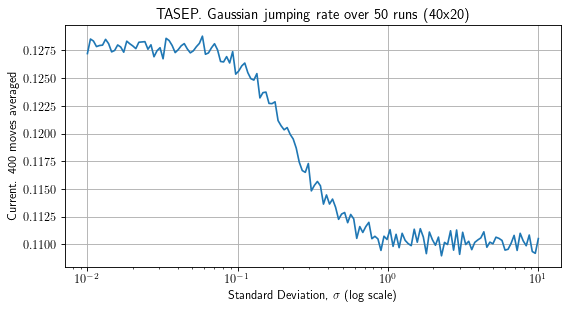

In [42]:
if __name__ == '__main__':
    # Simulation parameters
    runsNumber = 50
    totalMCS = 70 #Total number of Monte Carlo steps per single run
    Lx = 40 # Number of columns, length
    Ly = 20 # Number of rows, height
    init = "chess"
    mu = 0.5
    fixed_sigma = 0.001
    
    N = Lx * Ly // 2
    size = Lx * Ly
    current_averaging_time = int(N / 2) - 1  # Number of MCS to average over
 #   current_averaging_time = N  # Number of MCS to average over
    

    plt.rcParams["figure.figsize"] = (8, 4)
    plt.rcParams["figure.dpi"] = 80
    plt.rcParams["font.size"] = 11

   # Fixed sigma plots
    #density_particles(fixed_sigma)
    #autocorrelation_plot(fixed_sigma)
    #occup_prob(fixed_sigma)
    #current_plot(fixed_sigma)
    
   # Different sigmas plots
    #currents_sigmas_plot()
    average_run_current_over_sigmas()
    
    #DensityParticlesTot, CorrTot, CurrentAlongTot, CurrentTransvTot, HorizontalOccupProb, JumpRate_movie, JumpRate_short_movie = Simulate(runsNumber, totalMCS, Lx, Ly, init, mu, fixed_sigma)    
    

In [12]:
# MOVIE
# Simulation parameters
runsNumber = 1
totalMCS = 3 #Total number of Monte Carlo steps per single run
Lx = 40 # Number of columns, length
Ly = 20 # Number of rows, height
init = "chess"
mu = 0.5
fixed_sigma = 0.3

N = Lx * Ly // 2
size = Lx * Ly

# Movie of each MCS at the last run
DensityParticlesTot, CorrTot, CurrentAlongTot, CurrentTransvTot, HorizontalOccupProb, JumpRate_movie, JumpRate_short_movie = Simulate(runsNumber, totalMCS, Lx, Ly, init, mu, fixed_sigma)

fig = plt.figure()
ax = fig.add_subplot(111)
#fig.patch.set_facecolor('grey') #Change background color

# To position colorbars 
div = make_axes_locatable(ax)
cax = div.append_axes('right', '5%', '5%')

cv0 = JumpRate_movie[0]
im = ax.imshow(cv0, cmap = "gnuplot")
cb = fig.colorbar(im, cax=cax)

#tx1 = fig.annotate('MC 1', xy=(0,-0))
tx2 = ax.set_title('Frame 0 after one MCS of the last run', y=1)

axoff = ax.axis('off')
plt.close() # To not have the plot of frame 0 


def animate(frame):
    arr = JumpRate_movie[frame]
    vmax     = 1
    vmin     = np.min(arr)
    im.set_data(arr)
    im.set_clim(vmin, vmax)
    cb.ax.set_ylabel('Jumping Rate')
    #tx1.set_text('MC 1')
    tx2.set_text('Frame {0}'.format(frame))
    # The colorbar updates itself when the mappable it watches (im) changes

#ani = FuncAnimation(fig, animate, frames=len(System_movie), repeat=False)
ani = FuncAnimation(fig, animate, frames=len(JumpRate_movie), repeat=False)
HTML(ani.to_jshtml())

#ani.save('Pictures/animation_checkboard.mp4')
# #plt.show()